In [1]:
import numpy as np
import MDAnalysis as mda
from MDAnalysis.analysis import distances
import torch 
import torch.nn as nn
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from deeptime.util.data import TrajectoryDataset
from deeptime.util.torch import MLP
from deeptime.decomposition import VAMP
from deeptime.decomposition.deep import VAMPNet,VAMPNetModel, koopman_matrix
from deeptime.util.validation import implied_timescales, ck_test
from deeptime.plots import plot_implied_timescales, plot_ck_test
from tqdm.notebook import tqdm
from tqdm import tqdm
import json


/localscratch/zippoema/lib/python_envs/hpa_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/localscratch/zippoema/lib/python_envs/hpa_env/lib/python3.11/site-packages/MDAnalysis/topology/TPRParser.py:160: DeprecationWarning: 'xdrlib' is deprecated and slated for removal in Python 3.13
  import xdrlib


In [2]:
import sys
import os

# Absolute path to your module's directory
module_path = os.path.abspath('/localscratch/zippoema/git/HPA/src/')
if module_path not in sys.path:
    sys.path.insert(0, module_path)

import hpa.util
import hpa.msm
import hpa.plots

In [3]:
plt.style.use('/localscratch/zippoema/md_plots/plot.mplstyle')

In [4]:
path_tr = '/media/zippoema/Elements/zippo_phd_data/additional_simulations/single-tdp43/data_hps/sim_no-phospho/'
path_simple = '/localscratch/zippoema/project_ness/simulations/cycle_ness/simple-ness_ck1d_masspSer/'
path_simple_pp3 = '/localscratch/zippoema/project_ness/simulations/cycle_ness/simple-ness_pp3_masspSer/'
path = '/localscratch/zippoema/project_ness/simulations/ness_1-ck1d_1-pp3/'


In [212]:
!ls /localscratch/zippoema/project_ness/simulations/no_pser_mass_method/simple-ness_ck1d_CAL3/sim_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_200K_5k

ck-test_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_VAMPnet_HPS_tlag5.png
cycle_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_VAMPnet_HPS_tlag5.png
dmu_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_VAMPnet_HPS_tlag5.png
input1_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_200K_5k.in
input1_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_200K_5k.in~
input1_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_5k.in~
input2_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_200K_5k.in
input2_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_200K_5k.in~
input3_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_200K_5k.in
input3_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_200K_5k.in~
its_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_VAMPnet_HPS_tlag5.png
network_distances_com-ck1d-open.dat
sim1_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_20us_changesBCKP.txt
sim1_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_20us_changes.txt
sim1_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_20us_contactsBCKP.txt
sim1_ser19_dmu-5_

In [5]:
# CUDA or CPU
if torch.cuda.is_available():
        device = torch.device("cuda")
        torch.backends.cudnn.benchmark = True
        print("cuda")
else:
        device = torch.device("cpu")
        print("cpu")
torch.set_num_threads(12)

cuda


## Create distances file


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5488.59it/s]


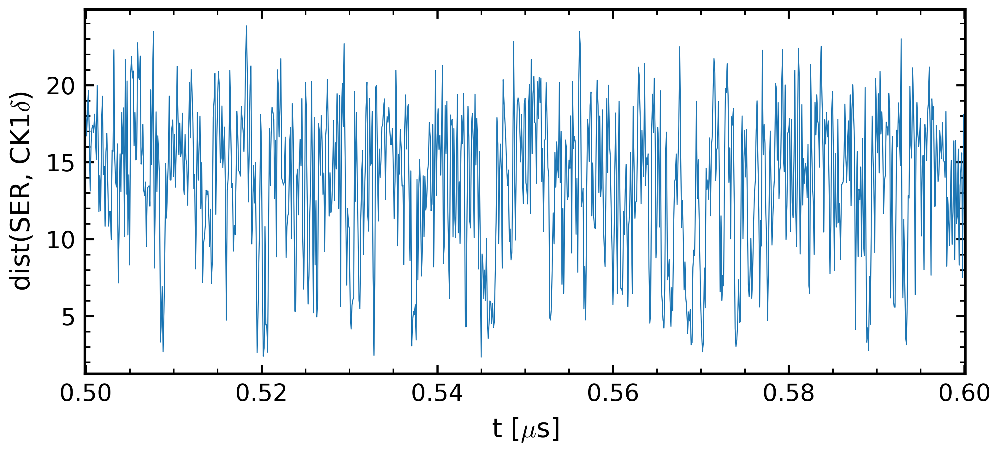

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5560.66it/s]


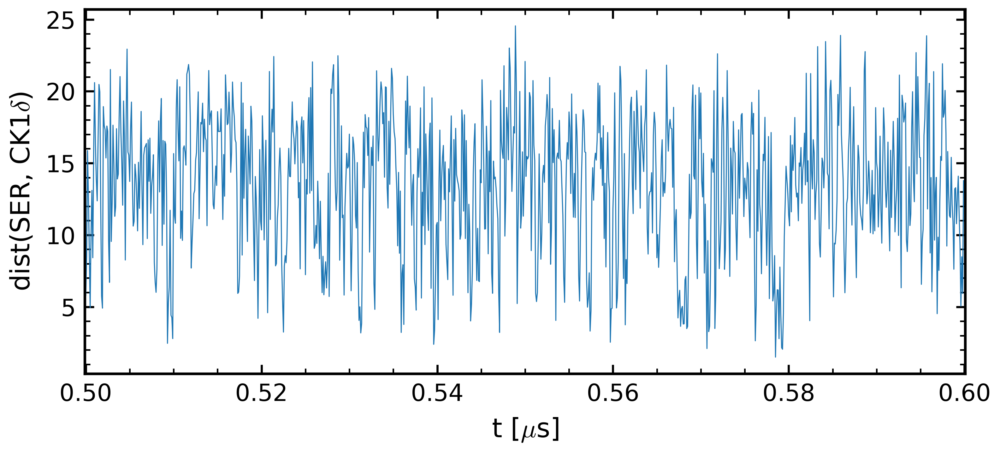

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5523.71it/s]


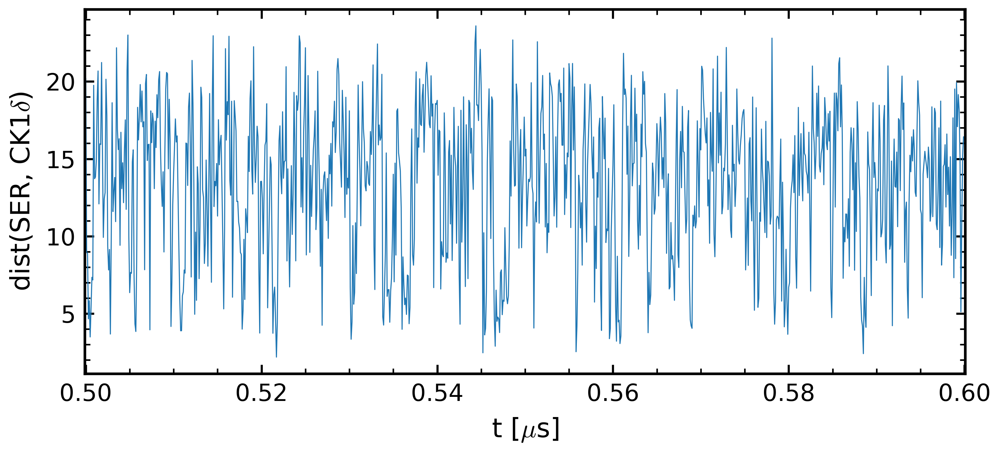

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5466.02it/s]


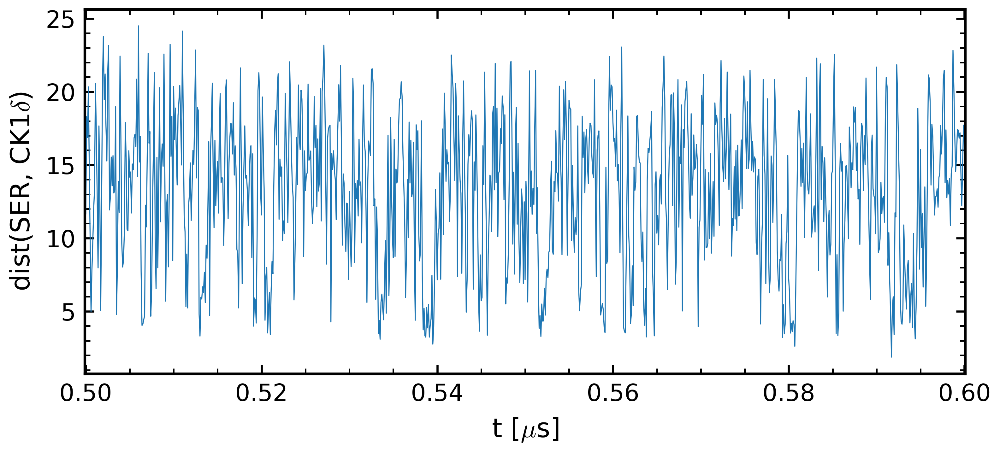

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:03<00:00, 5558.43it/s]


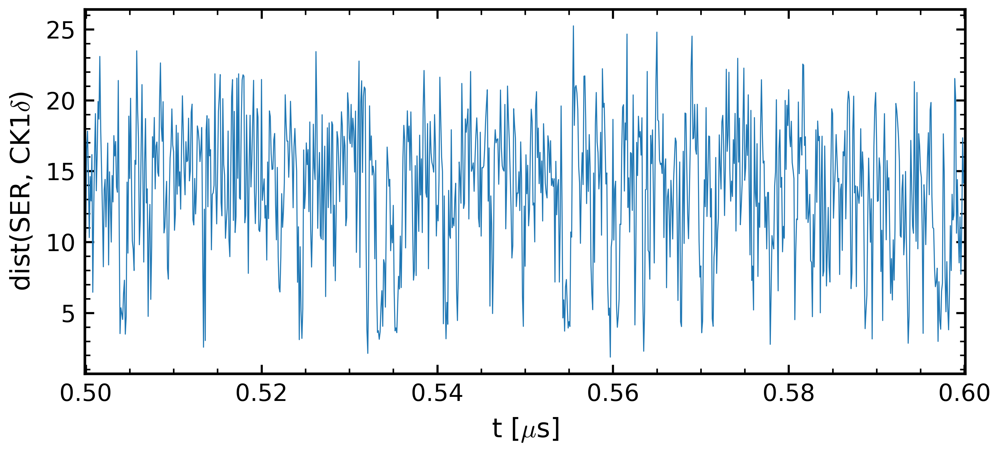

In [6]:
for s in range(1,6):
    d = hpa.util.create_distance_file(path+f'sim_ser19_dmu-5_1-tdp43-2pser_1-ck1d-open/sim{s}_ser19_dmu-5_1-tdp43-2pser_com-ck1d-open_CAL3_dump.gsd', 
                                         id1=[300,301,302], id2=[i for i in range(154)], mean1=True, therm=0)
    #tmp = hpa.util.create_distance_file(path+f'sim_ser19_dmu-10_1-tdp43-2pser_1-ck1d-open/sim{s}_ser19_dmu-10_1-tdp43-2pser_com-ck1d-open_CAL3_dump.gsd', 
    #                                     id1=[445+92,445+94,445+120,445+152,445+283], id2=[i for i in range(154)], mean1=True, therm=0)
    #d = np.append(d, tmp, axis=1)
    np.savetxt(path+f'sim_ser19_dmu-5_1-tdp43-2pser_1-ck1d-open/sim{s}_ser19_dmu-5_1-tdp43-2pser_com-ck1d-open_CAL3_dist.txt', d)
    hpa.plots.plot_dist(d,part_id=5,start=5000,end=6000)

In [487]:
# MACROs
''' VAMPnet hyper-parameters '''
val_perc = 0.3
nodes = [154, 30, 2]
learn_rate = 0.5e-2
batch_sz = 40000
epochs = 100
eps_regularize = 1e-07
TLAG=10

In [167]:
# MACROs
''' VAMPnet PP3 hyper-parameters '''
val_perc = 0.3
nodes = [154, 30, 2]
learn_rate = 0.5e-2
batch_sz = 40000
epochs = 50
eps_regularize = 1e-07
TLAG=2

# Dataset

### Trajectory

Load trajectory data for training

In [574]:
dist_ser = np.loadtxt(path_tr+"sim1_no-phospho_ck1d-rigid_tdp43_dist.txt")[1000:]
dist_ser2 = np.loadtxt(path_tr+"sim2_no-phospho_ck1d-rigid_tdp43_dist.txt")[1000:]
dist_ser = np.append(dist_ser, dist_ser2, axis=0)
dist_ser2 = np.loadtxt(path_tr+"sim3_no-phospho_ck1d-rigid_tdp43_dist.txt")[1000:]
dist_ser = np.append(dist_ser, dist_ser2, axis=0)

In [30]:
# try with CALVADOS3 trajectory
path_old = '/localscratch/zippoema/project_ness/simulations/no_pser_mass_method/simple-ness_ck1d_CAL3/sim_ser19_dmu-5_1-tdp43-5pser_1-ck1d-open_200K_5k/'

dist_ser = np.loadtxt(path_old+f'sim1_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_dist.txt')
dist_ser = np.append(dist_ser, np.loadtxt(path_old+f'sim1_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_20us_dist.txt'), axis=0 )
for s in range(2,4):
    dist_ser = np.append(dist_ser, np.loadtxt(path_old+f'sim{s}_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_dist.txt'), axis=0 )
    dist_ser = np.append(dist_ser, np.loadtxt(path_old+f'sim{s}_ser19_dmu-5_1-tdp43-5pser_com-ck1d-open_CAL3_200K_5k_20us_dist.txt'), axis=0 )
dist_ser.shape


(2400000, 154)

Data for TDP-43 + PP3

In [28]:
i = 1
dist_ser = np.loadtxt(path_simple_pp3+f'sim_ser19_dmu0_1-tdp43-5pser_1-pp3_200K_5k_mpSer_rs/sim{i}_ser19_dmu0_1-tdp43-5pser_com-pp3_CAL3_200K_5k_mpSer_rs_dist.txt')[500:]
#tmp = np.loadtxt(path_simple_pp3+f'sim_ser19_dmu+5_1-tdp43-5pser_1-pp3_200K_5k_mpSer_rs/sim{i}_ser19_dmu+5_1-tdp43-5pser_com-pp3_CAL3_200K_5k_mpSer_rs_dist.txt')[500:]
#dist_ser = np.append(dist_ser, tmp, axis=0) 
for i in range(2,6):
    tmp = np.loadtxt(path_simple_pp3+f'sim_ser19_dmu0_1-tdp43-5pser_1-pp3_200K_5k_mpSer_rs/sim{i}_ser19_dmu0_1-tdp43-5pser_com-pp3_CAL3_200K_5k_mpSer_rs_dist.txt')[500:]
    dist_ser = np.append(dist_ser, tmp, axis=0) 
#    tmp = np.loadtxt(path_simple_pp3+f'sim_ser19_dmu+5_1-tdp43-5pser_1-pp3_200K_5k_mpSer_rs/sim{i}_ser19_dmu+5_1-tdp43-5pser_com-pp3_CAL3_200K_5k_mpSer_rs_dist.txt')[500:]
#    dist_ser = np.append(dist_ser, tmp, axis=0) 

In [29]:
print(dist_ser.shape)


(1997500, 154)


Dataset with trajectory, split into training and validation datasets (70% and 30%)

In [168]:
dataset_ser = TrajectoryDataset(TLAG, dist_ser.astype(np.float32))

n_val_ser = int(len(dataset_ser)*val_perc)
train_data_ser, val_data_ser = torch.utils.data.random_split(dataset_ser, [len(dataset_ser) - n_val_ser, n_val_ser])


### Creating VAMPNet

VAMPnet lobe 

In [169]:
lobe = nn.Sequential(
    nn.BatchNorm1d(nodes[0]),
    nn.Linear(nodes[0], nodes[1]), nn.ELU(),
    nn.Linear(nodes[1], nodes[2]),
    nn.Softmax(dim=1)  # obtain fuzzy probability distribution over output states
)
print(lobe)
lobe = lobe.to(device=device)
vampnet_ser = VAMPNet(lobe=lobe, learning_rate=learn_rate, device=device, epsilon=eps_regularize)

loader_train_ser = DataLoader(train_data_ser, batch_size=batch_sz, shuffle=True)
loader_val_ser = DataLoader(val_data_ser, batch_size=len(val_data_ser), shuffle=False)


Sequential(
  (0): BatchNorm1d(154, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (1): Linear(in_features=154, out_features=30, bias=True)
  (2): ELU(alpha=1.0)
  (3): Linear(in_features=30, out_features=2, bias=True)
  (4): Softmax(dim=1)
)


### Training

In [170]:
model_ser = vampnet_ser.fit(loader_train_ser, n_epochs=epochs,
                        validation_loader=loader_val_ser).fetch_model()

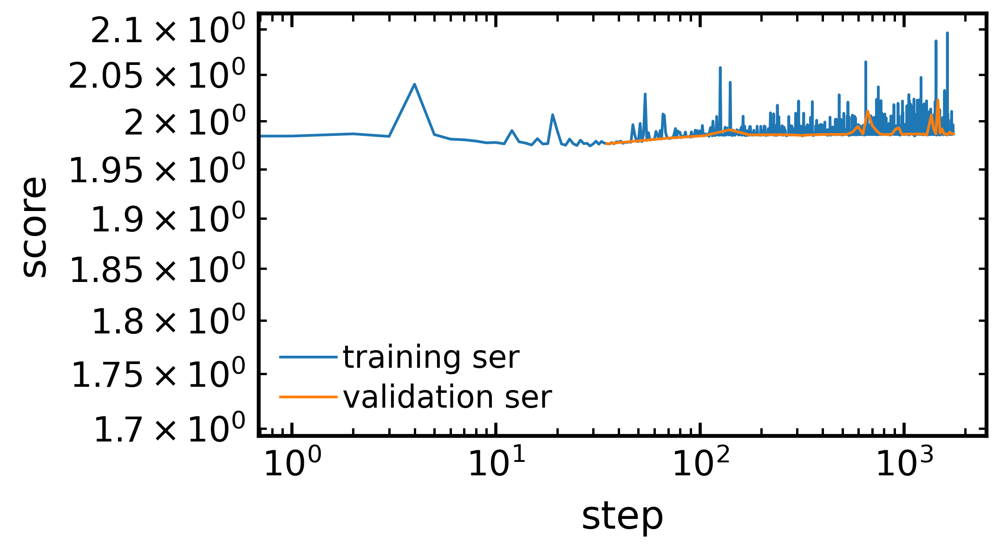

1.9864354133605957
1.9868597984313965


In [171]:
plt.loglog(*vampnet_ser.train_scores.T, label='training ser', linewidth=0.7)
plt.loglog(*vampnet_ser.validation_scores.T, label='validation ser', linewidth=0.7)
plt.xlabel('step')
plt.ylabel('score')
plt.legend()
plt.show()

print(vampnet_ser.train_scores.T[1,-1])
print(vampnet_ser.validation_scores.T[1,-1])


In [174]:
config = {
    "nodes": nodes,
    "learn_rate": learn_rate,
    "batch_sz": batch_sz,
    "epochs": epochs,
    "eps_regularize": eps_regularize,
    "TLAG": TLAG
}
with open("/localscratch/zippoema/project_ness/analysis/VAMPnets/vampnet_config_PP3_CAL3_tlag2_trained.json", "w") as f:
    json.dump(config, f)

In [175]:
torch.save(vampnet_ser.lobe.state_dict(), "/localscratch/zippoema/project_ness/analysis/VAMPnets/vampnet_weights_PP3_CAL3_tlag2_trained.pt")

In [172]:
# Transform distance into percentage of being in state 0 or 1 
featser_ser = model_ser.transform(dist_ser)

# assign 0 if percentage of state 0 is over 50%, otherwise 1
assignsser_ser = featser_ser.argmax(1)
print((np.min(assignsser_ser),np.max(assignsser_ser)))


(0, 1)


### Check VAMPNet result 


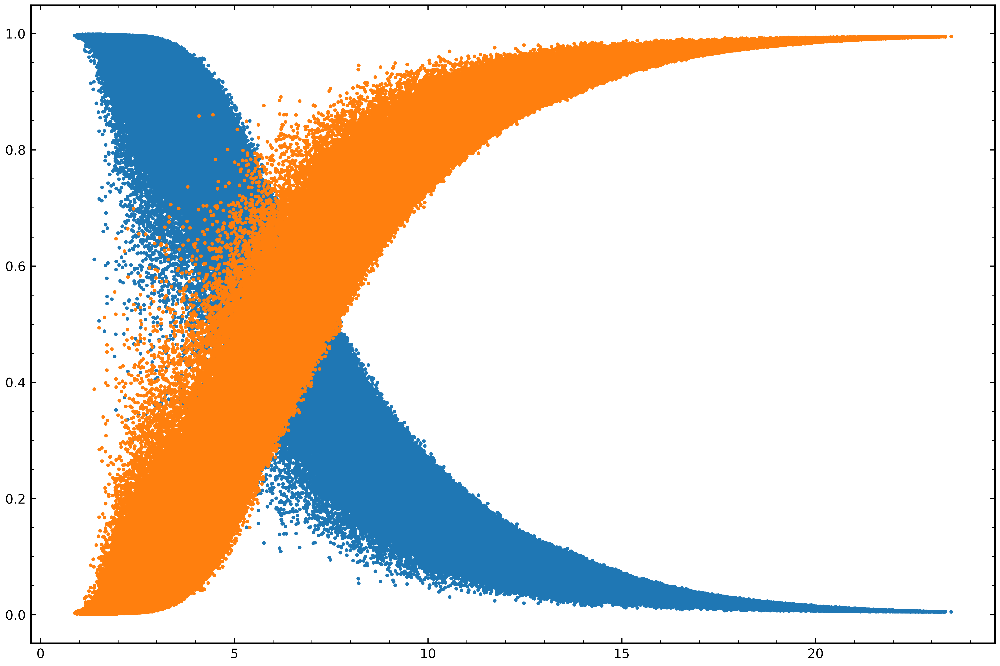

In [173]:
f, axes = plt.subplots(1, 1, figsize=(12, 8))
axes.plot(np.min(dist_ser[:,:154],axis=1), featser_ser[:, 0], ".")
axes.plot(np.min(dist_ser[:,:154],axis=1), featser_ser[:, 1], ".")


In [20]:
vamp_estimator = VAMP(lagtime=TLAG, observable_transform=model_ser)
vamp = vamp_estimator.fit(dist_ser.astype(np.float32)).fetch_model()
print(f"VAMP-2 score under lag {TLAG}: s = {vamp.score(2).round(2)}")

VAMP-2 score under lag 5: s = 1.95


100%|████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.93s/it]


Text(0, 0.5, 'timescale')

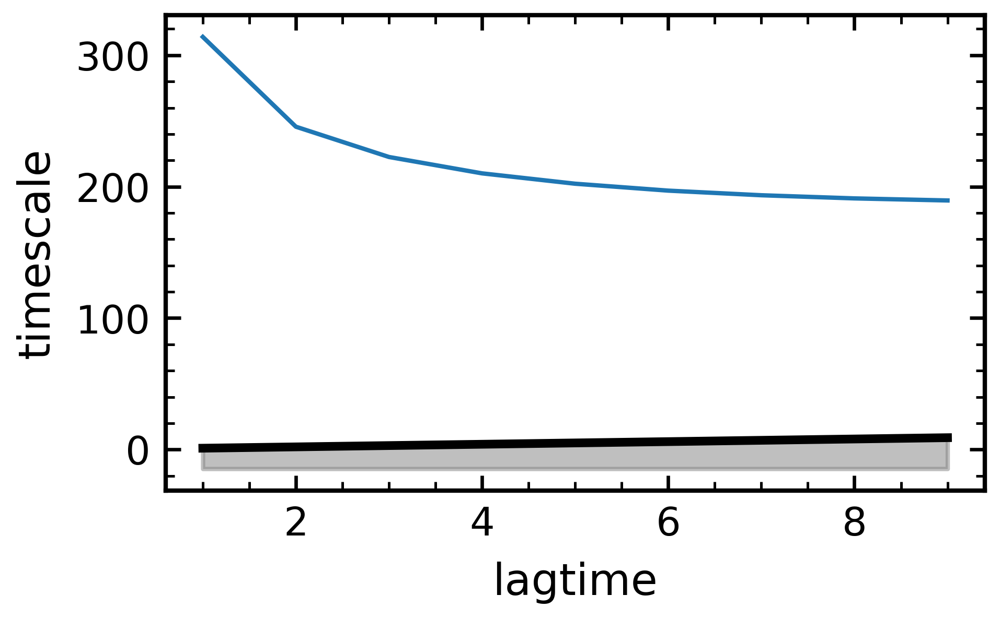

In [21]:
lagtimes = np.arange(1, 10, dtype=np.int32)
vamp_models = [VAMP(lagtime=lag, observable_transform=model_ser).fit_fetch(dist_ser.astype(np.float32)) for lag in tqdm(lagtimes)]

ax = plot_implied_timescales(implied_timescales(vamp_models))
ax.set_xlabel('lagtime')
ax.set_ylabel('timescale')

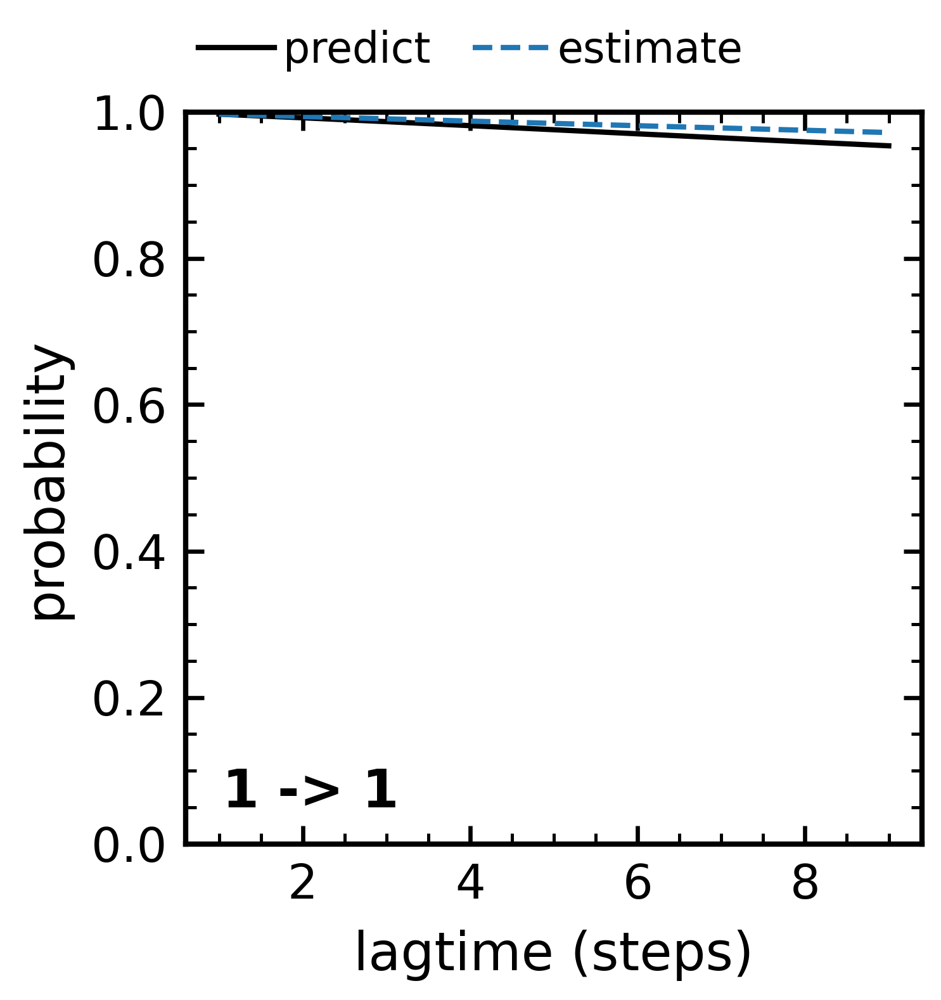

In [22]:
plot_ck_test(vamp_models[0].ck_test(vamp_models));


# Transform trajectory

In [6]:
def create_boundtraj_VAMPnet_from_dist(dist, model_ser_load, save_boundtraj=None, zeroisbound=False):
    
    feat_ser = model_ser_load.transform(dist)
    print(feat_ser[0], dist[0][0])
    assigns_ser = hpa.msm.inserting_tps_state(feat_ser.argmax(1), feat_ser[:,0], 0.3)
    f, axes = plt.subplots(1, 1, figsize=(8, 3))
    axes.scatter(np.arange(len(dist[:20000,1])), dist[:20000,1], c=assigns_ser[:20000], s=4)
    plt.show()
    filtered_dtraj = hpa.msm.transition_filter_state_trj(assigns_ser, tps_state_num=2).astype("bool")
    if zeroisbound:
        filtered_dtraj = ~filtered_dtraj
    
    print(filtered_dtraj[0], dist[0][0])
    plt.figure(figsize=(4.77,1.97))
    plt.plot(dist[0:1000,140], '--b', linewidth=0.5)
    plt.plot(15*~filtered_dtraj[0:1000]+5, 'r')
    plt.grid()
    plt.show()
    if save_boundtraj is not None:
        np.savetxt(save_boundtraj, filtered_dtraj)


In [7]:
path_simple_an = '/localscratch/zippoema/project_ness/analysis/cycle_ness/simple-ness_ck1d_masspSer/'
path_simple_pp3_an = '/localscratch/zippoema/project_ness/analysis/cycle_ness/simple-ness_pp3_masspSer/'

path_an = '/localscratch/zippoema/project_ness/analysis/ness_1-ck1d_1-pp3/'
path_vampnet = '/localscratch/zippoema/project_ness/analysis/VAMPnets/'
path_work = '/localscratch/zippoema/working_dir/'

vampnet = '_PP3_CAL3_tlag2'

In [8]:
with open(f"/localscratch/zippoema/project_ness/analysis/VAMPnets/vampnet_config{vampnet}_trained.json") as f:
    cfg = json.load(f)

cfg

{'nodes': [154, 30, 2],
 'learn_rate': 0.005,
 'batch_sz': 40000,
 'epochs': 50,
 'eps_regularize': 1e-07,
 'TLAG': 2}

In [9]:
lobe_load = nn.Sequential(
    nn.BatchNorm1d(cfg['nodes'][0]),
    nn.Linear(cfg['nodes'][0], cfg['nodes'][1]), nn.ELU(),
    nn.Linear(cfg['nodes'][1], cfg['nodes'][2]),
    nn.Softmax(dim=1)  # obtain fuzzy probability distribution over output states
)
print(lobe_load)
lobe_load = lobe_load.to(device=device)
lobe_load.load_state_dict(torch.load(path_vampnet+f"vampnet_weights{vampnet}_trained.pt"))

model_ser_load = VAMPNetModel(lobe=lobe_load, device=device)


Sequential(
  (0): BatchNorm1d(154, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (1): Linear(in_features=154, out_features=30, bias=True)
  (2): ELU(alpha=1.0)
  (3): Linear(in_features=30, out_features=2, bias=True)
  (4): Softmax(dim=1)
)


Transform simulation trajectory into discrete trajectory of bound/unbound state

[0.997083 0.002917] 4.487130641937256


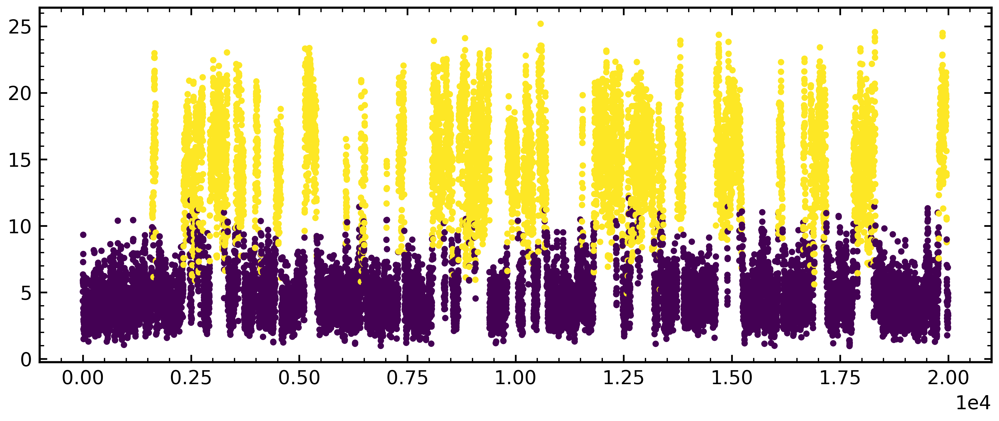

True 4.487130641937256


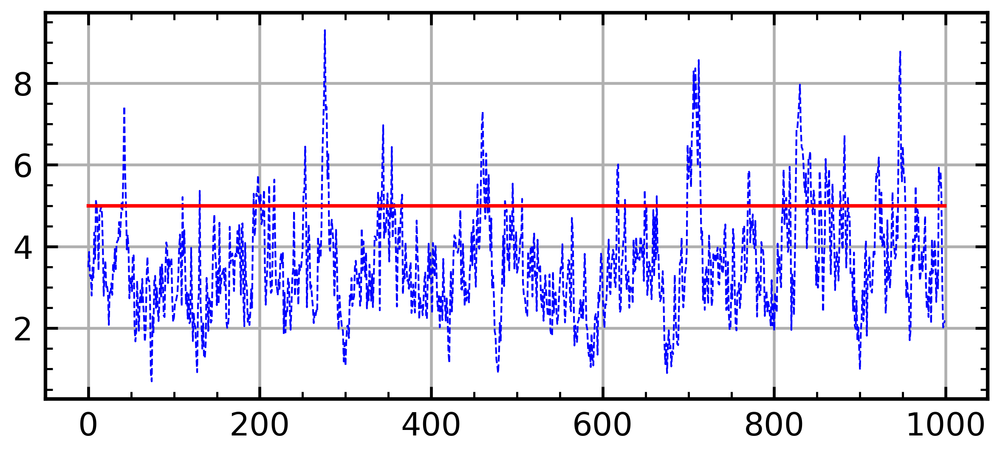

[0.09991666 0.9000833 ] 12.526642799377441


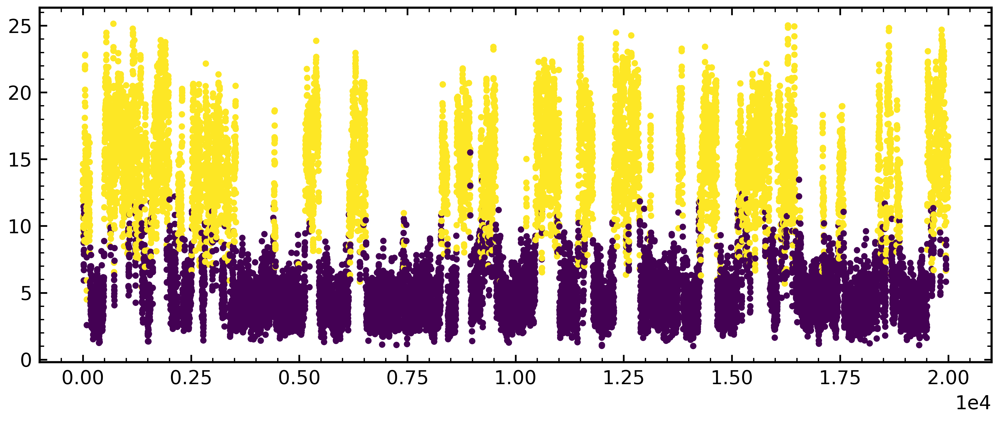

False 12.526642799377441


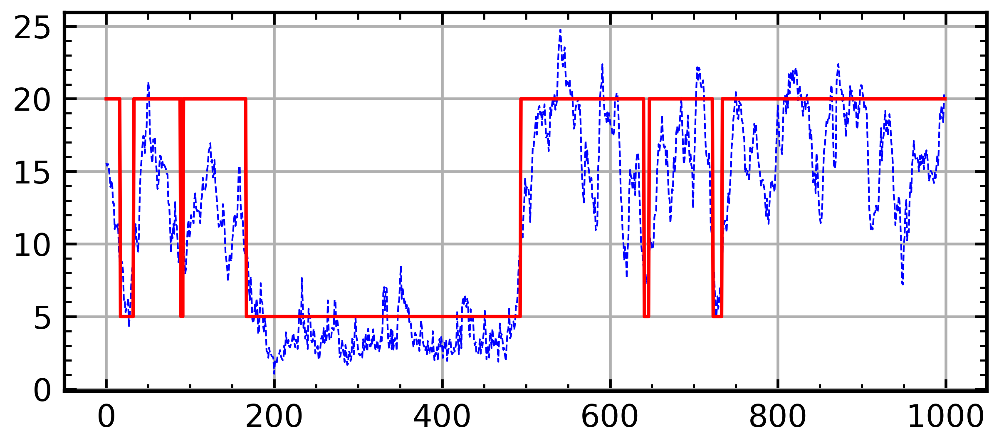

[0.9083704  0.09162966] 7.443644046783447


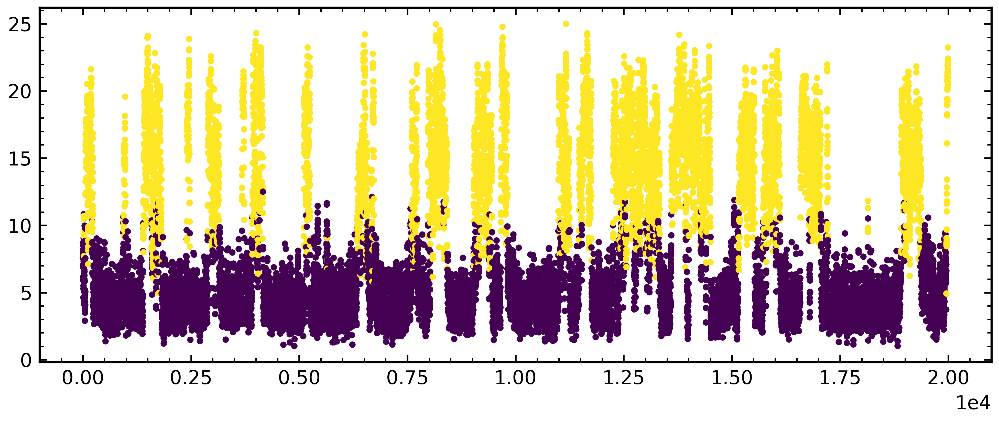

True 7.443644046783447


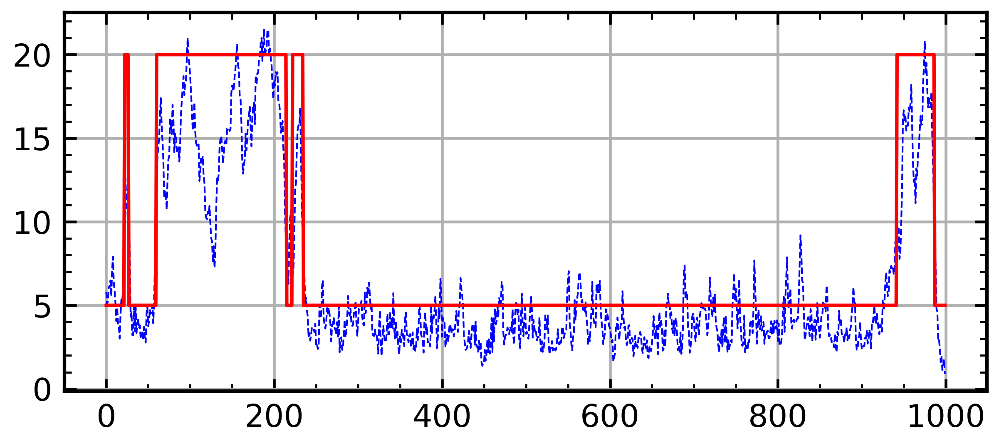

[0.9979814  0.00201851] 5.049008846282959


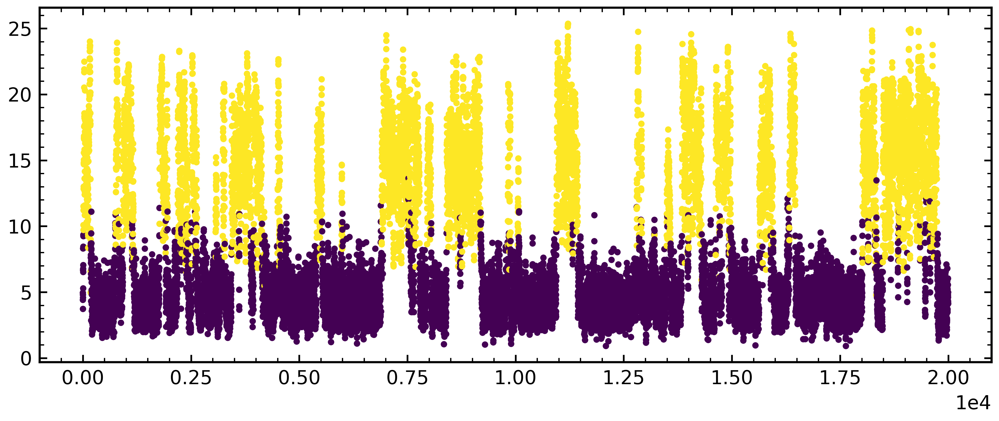

True 5.049008846282959


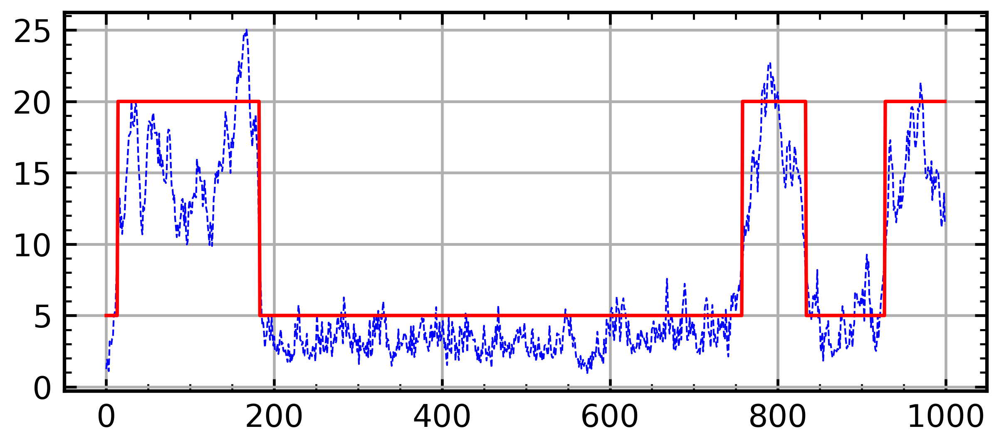

[0.04429455 0.95570546] 21.081371307373047


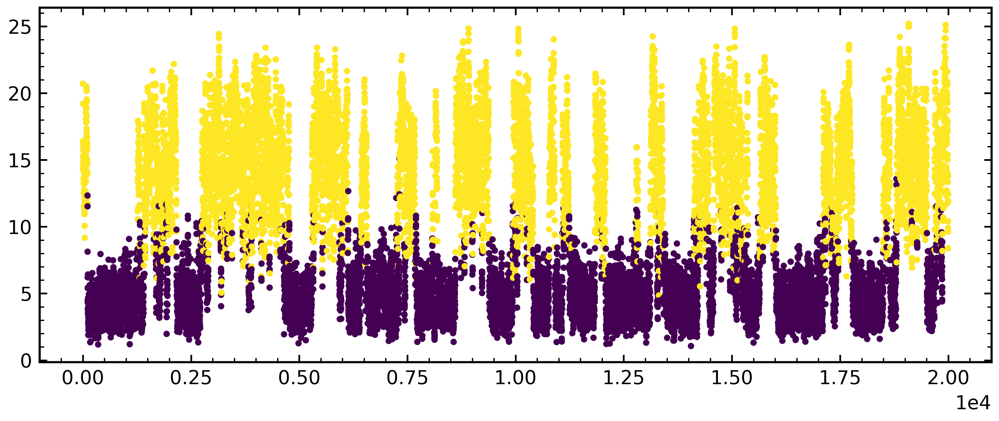

False 21.081371307373047


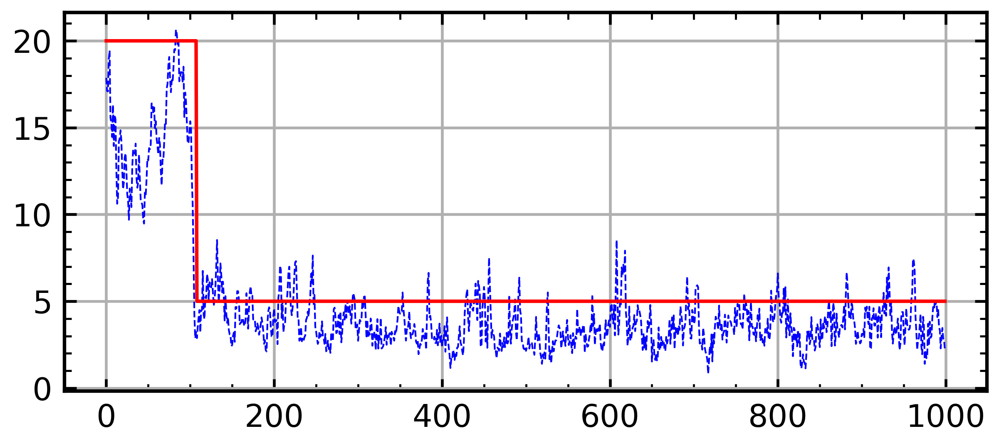

In [19]:
dmu = '0'
rdump = 5
enzymes = '1-pp3'
enzfile = 'com-pp3'
temp = '200K_'
nsims = 5
timelim = ''
timelim = '_40us'

for s in range(1, 1+nsims):
    dist = np.loadtxt(path_simple_pp3+f'sim_ser19_dmu{dmu}_1-tdp43-5pser_{enzymes}_{temp}{rdump}k_mpSer_rs/sim{s}_ser19_dmu{dmu}_1-tdp43-5pser_{enzfile}_CAL3_{temp}{rdump}k_mpSer_rs{timelim}_dist.txt')
    create_boundtraj_VAMPnet_from_dist(dist, model_ser_load, zeroisbound=True,
                                       save_boundtraj=path_simple_pp3_an+f'sim_ser19_dmu{dmu}_1-tdp43-5pser_{enzymes}_{temp}{rdump}k_mpSer_rs/sim{s}_ser19_dmu{dmu}_1-tdp43-5pser_{enzfile}_CAL3_{temp}{rdump}k_mpSer_rs{timelim}_boundtraj{vampnet}.txt')


In [195]:
# Select NESS simulation
s = 3

dmu = '+5'
rdump = 5
enzymes = '1-pp3'
enzfile = 'com-pp3'
temp = '200K_'

In [196]:
dist = np.loadtxt(path_simple_pp3+f'sim_ser19_dmu{dmu}_1-tdp43-5pser_{enzymes}_{temp}{rdump}k_mpSer_rs/sim{s}_ser19_dmu{dmu}_1-tdp43-5pser_{enzfile}_CAL3_{temp}{rdump}k_mpSer_rs_dist.txt')
#dist = np.loadtxt(path_work+f'simple-ness_CAL3/sim_ser19_dmu-{dmu_p}_1-tdp43-5pser_1-{rigid}ck1d-open_200K_{rdump}k/sim{s}_ser19_dmu-{dmu_p}_1-tdp43-5pser_com-{rigid}ck1d-open_CAL3_200K_{rdump}k_dist.txt')
#dist = np.append(dist, np.loadtxt(path_simple+f'sim_ser19_dmu-{dmu_p}_1-tdp43-5pser_1-{rigid}ck1d-open_{rdump}k/sim{s}_ser19_dmu-{dmu_p}_1-tdp43-5pser_com-{rigid}ck1d-open_CAL3_{rdump}k_10us_dist.txt'), axis=0 )
dist.shape
print(len(dist))



400000


In [197]:
feat_ser = model_ser_load.transform(dist)

print(feat_ser[0], dist[0][0])

assigns_ser = hpa.msm.inserting_tps_state(feat_ser.argmax(1), feat_ser[:,0], 0.3)

[0.02754971 0.97245026] 20.251049041748047


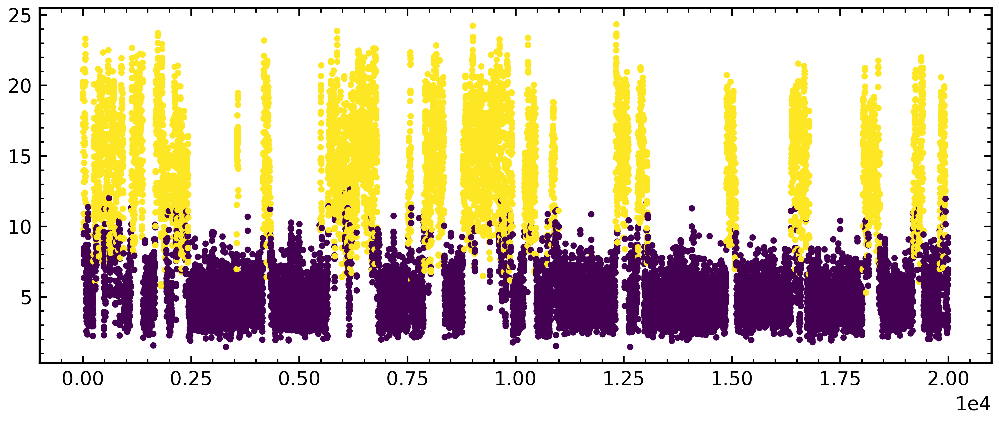

In [198]:
f, axes = plt.subplots(1, 1, figsize=(8, 3))

axes.scatter(np.arange(len(dist[:20000,1])), dist[:20000,1], c=assigns_ser[:20000], s=4)
plt.show()

In [199]:
# Filter out intermediate state using Transition-based analysis
filtered_dtraj = hpa.msm.transition_filter_state_trj(assigns_ser, tps_state_num=2).astype("bool")

print(filtered_dtraj[0], dist[0][0])

True 20.251049041748047


In [200]:
# if state 0 of VAMPnet is bound, swap state 1 and state 0
filtered_dtraj = ~filtered_dtraj

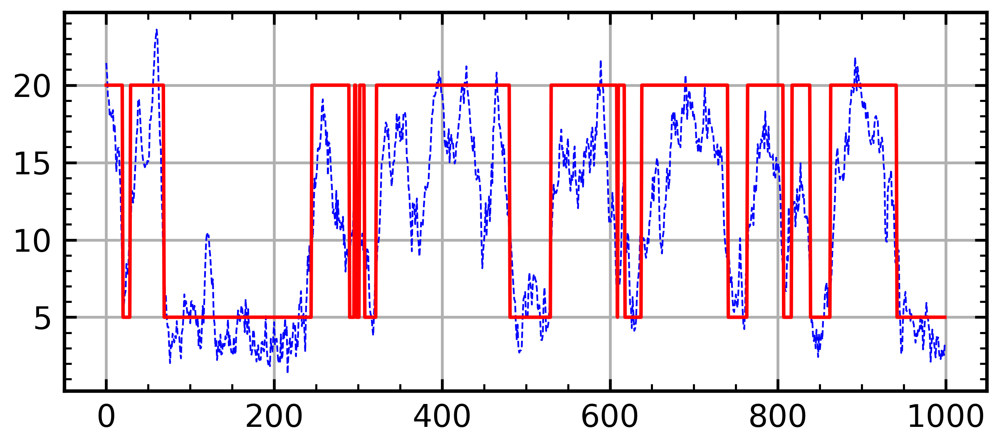

In [201]:
plt.figure(figsize=(4.77,1.97))
plt.plot(dist[0:1000,140], '--b', linewidth=0.5)
plt.plot(15*~filtered_dtraj[0:1000]+5, 'r')
plt.grid()
plt.show()

In [202]:
np.savetxt(path_simple_pp3_an+f'sim_ser19_dmu{dmu}_1-tdp43-5pser_{enzymes}_{temp}{rdump}k_mpSer_rs/sim{s}_ser19_dmu{dmu}_1-tdp43-5pser_{enzfile}_CAL3_{temp}{rdump}k_mpSer_rs_boundtraj{vampnet}.txt', filtered_dtraj)

In [217]:
#np.savetxt(path_mc+f'sim{s}_ser19_dmu-{dmu}_1-tdp43-5pser_com-ck1d-open_CAL3_10k_MCkin_boundtraj.txt', filtered_dtraj)

Trajectories with both CK1d and PP3 (6 or 8 states)

In [440]:
# Select NESS simulation
s = 10
dmu_k = 5

In [441]:
dist = np.loadtxt(path+f'sim_ser19_dmu-{dmu_k}_0_1-tdp43-5pser_1-ck1d-open_1-pp3_fixed/sim{s}_ser19_dmu-{dmu_k}_0_1-tdp43-5pser_com-ck1d-open_com-pp3_fixed_CAL3_dist.txt')

print(dist.shape)

feat_ser_k = model_ser.transform(dist[:,:154])
feat_ser_p = model_ser.transform(dist[:,154:])

print(feat_ser_k[0], dist[0][0])

(12000, 308)
[0.81572014 0.1842799 ] 10.593795410872252


In [442]:
assigns_ser_k = hpa.msm.inserting_tps_state(feat_ser_k.argmax(1), feat_ser_k[:,0], 0.3)
assigns_ser_p = hpa.msm.inserting_tps_state(feat_ser_p.argmax(1), feat_ser_p[:,0], 0.3)

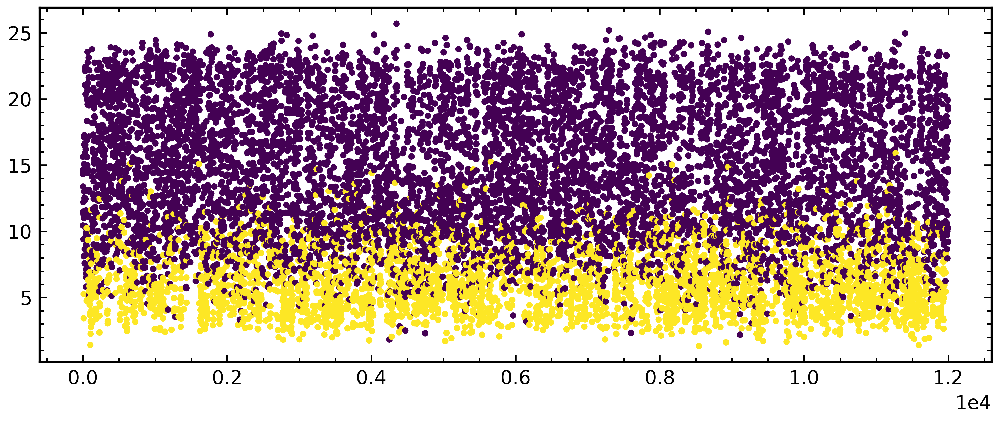

In [443]:
f, axes = plt.subplots(1, 1, figsize=(8, 3))

axes.scatter(np.arange(len(dist[:20000,1])), dist[:20000,1], c=assigns_ser_k[:20000], s=4)
plt.show()

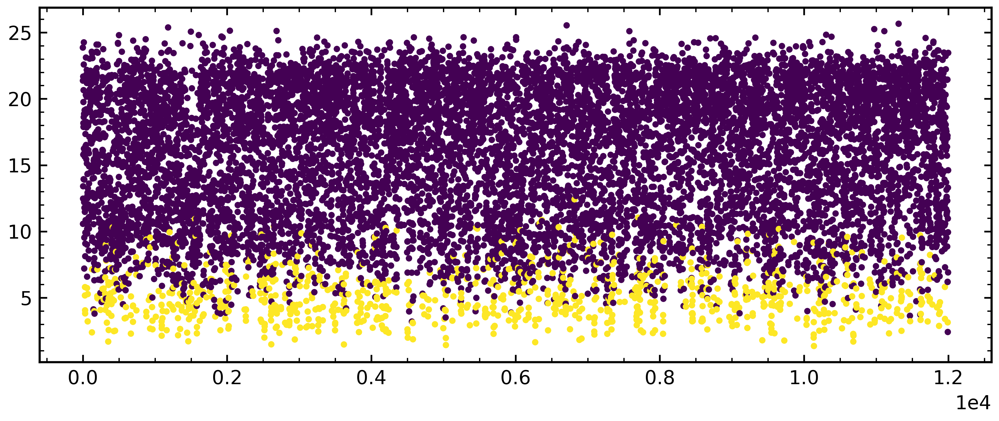

In [444]:
f, axes = plt.subplots(1, 1, figsize=(8, 3))

axes.scatter(np.arange(len(dist[:20000,200])), dist[:20000,200], c=assigns_ser_p[:20000], s=4)
plt.show()

In [445]:
# Filter out intermediate state using Transition-based analysis
filtered_dtraj_k = hpa.msm.transition_filter_state_trj(assigns_ser_k, tps_state_num=2).astype("bool")
filtered_dtraj_p = hpa.msm.transition_filter_state_trj(assigns_ser_p, tps_state_num=2).astype("bool")

print(filtered_dtraj_k[0], dist[0][0])
print(filtered_dtraj_p[0], dist[0][200])

False 10.593795410872252
False 23.861419642394615


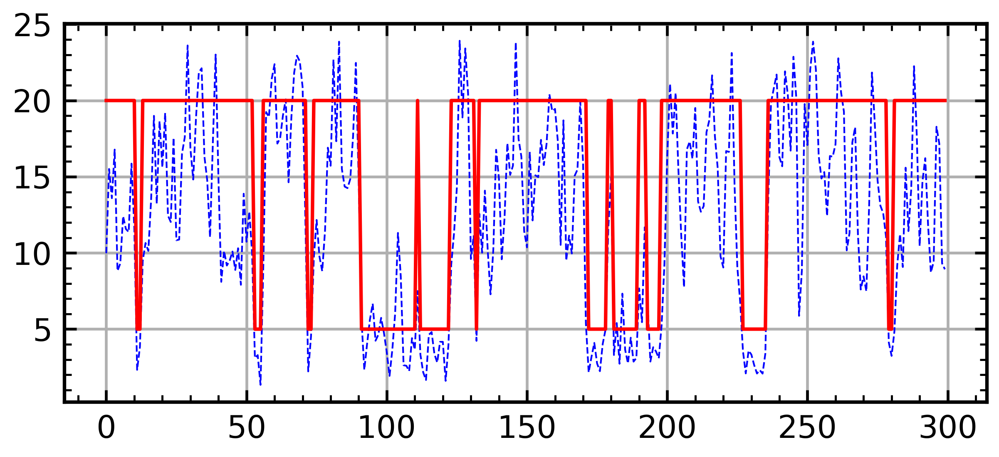

In [446]:
plt.figure(figsize=(4.77,1.97))
plt.plot(dist[0:300,140], '--b', linewidth=0.5)
plt.plot(15*~filtered_dtraj_k[0:300]+5, 'r')
plt.grid()
plt.show()

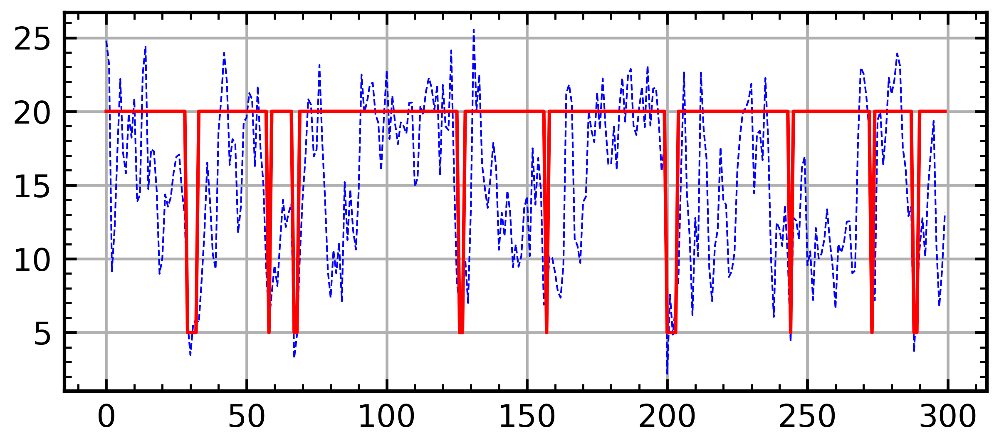

In [447]:
plt.figure(figsize=(4.77,1.97))
plt.plot(dist[0:300,240], '--b', linewidth=0.5)
plt.plot(15*~filtered_dtraj_p[0:300]+5, 'r')
plt.grid()
plt.show()

In [448]:
np.savetxt(path_an+f'sim_ser19_dmu-{dmu_k}_0_1-tdp43-5pser_1-ck1d-open_1-pp3_fixed/sim{s}_ser19_dmu-{dmu_k}_0_1-tdp43-5pser_com-ck1d-open_com-pp3_fixed_CAL3_boundtraj_ck1d.txt', filtered_dtraj_k)
np.savetxt(path_an+f'sim_ser19_dmu-{dmu_k}_0_1-tdp43-5pser_1-ck1d-open_1-pp3_fixed/sim{s}_ser19_dmu-{dmu_k}_0_1-tdp43-5pser_com-ck1d-open_com-pp3_fixed_CAL3_boundtraj_pp3.txt', filtered_dtraj_p)